## 1. Исследовательский анализ данных





In [1]:
!pip install -q spacy keras_nlp sentence_transformers
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 52.4 MB/s eta 0:00:00
  Attempting uninstall: en-core-web-sm
    Found existing installation: en-core-web-sm 3.7.0
    Uninstalling en-core-web-sm-3.7.0:
      Successfully uninstalled en-core-web-sm-3.7.0
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [2]:
import os
import warnings
import time
from tqdm import tqdm
from tqdm import notebook
tqdm.pandas()

from PIL import Image
from pathlib import Path


import math
from scipy import stats as st
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split, GridSearchCV, GroupShuffleSplit, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, log_loss, f1_score, mean_squared_error


import re
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords as nltk_stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
import spacy

from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Reshape, RepeatVector, LSTM, Dropout
from tensorflow.keras.optimizers import Adam

import keras_nlp

import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob
import torch.nn as nn
from math import ceil

Using TensorFlow backend


Теперь импортируем данные и посмотрим, что они из себя представляют

In [3]:
PATH = '/kaggle/input/project/to_upload/'

In [4]:
# Распакуем наши данные



train_data = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))
train_data.name = 'train_data'

data_crowd = pd.read_csv(os.path.join(PATH, 'CrowdAnnotations.tsv'), sep='\t', names=['image', 'query_id', 'fraction', 'pros', 'cons'])
data_crowd.name = 'data_crowd'

data_expert = pd.read_csv(os.path.join(PATH, 'ExpertAnnotations.tsv'), sep='\t', names=['image', 'query_id', 'first', 'second', 'third'])
data_expert.name = 'data_expert'

test_query = pd.read_csv(os.path.join(PATH, 'test_queries.csv'), index_col=[0], sep='|')
test_query.name = 'test_query'

In [5]:
test_images = []
for filename in os.listdir(os.path.join(PATH, 'test_images')):
    if filename.endswith('.jpg'):
        image_path = os.path.join(os.path.join(PATH, 'test_images'), filename)
        image = Image.open(image_path)
        test_images.append(image)

In [6]:
test_image = pd.DataFrame(test_images, columns=['image'])
test_image.name = 'test_image'

In [7]:
train_images = []
for filename in os.listdir(os.path.join(PATH, 'train_images')):
    if filename.endswith('.jpg'):
        image_path = os.path.join(os.path.join(PATH, 'train_images'), filename)
        image = Image.open(image_path)
        train_images.append(image)

In [8]:
train_image = pd.DataFrame(train_images, columns=['image'])
train_image.name = 'train_image'

In [9]:
def display_table_info(name, data):
    print(name)
    print()
    print('Размер датасета:', data.shape)
    print()
    display(data.head(3))
    print()
    data.info()
    print('')
    print('')
    print('')

display_table_info('train_data', train_data)
display_table_info('data_crowd', data_crowd)
display_table_info('data_expert', data_expert)
display_table_info('test_query', test_query)
display_table_info('test_image', test_image)
display_table_info('train_image', train_image)

train_data

Размер датасета: (5822, 3)



,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB



data_crowd

Размер датасета: (47830, 5)



,image,query_id,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   fraction  47830 non-null  float64
 3   pros      47830 non-null  int64  
 4   cons      47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB



data_expert

Размер датасета: (5822, 5)



,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB



test_query

Размер датасета: (500, 3)



,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg



<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB



test_image

Размер датасета: (100, 1)



,image
0,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,<PIL.JpegImagePlugin.JpegImageFile image mode=...



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes



train_image

Размер датасета: (1000, 1)



,image
0,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,<PIL.JpegImagePlugin.JpegImageFile image mode=...



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   1000 non-null   object
dtypes: object(1)
memory usage: 7.9+ KB





Теперь необходимо добавить обобщенную экспертную оценку. В качестве результата возьмем, как предлагается, мнение большинсва. Если показания у всех экспертов разные, оставим результат пустым и удалим в последствии эти строки.

Для этого напишем функцию, получающую на вход строку из датасета, а возвращающую результат обобщения

### Количество уникальных изображений в обучающем и тестовом наборах

In [10]:
print()
print('Количество уникальных фото на трейне:', len(train_data['image'].unique()))
print()
print('Количество уникальных фото на тесте:', len(test_query['image'].unique()))


Количество уникальных фото на трейне: 1000

Количество уникальных фото на тесте: 100


### Количество уникальных запросов

In [11]:
print()
print('Количество уникальных запросов на тесте:', test_query.drop_duplicates().shape[0])


Количество уникальных запросов на тесте: 500


### Количество оценок в экспертном и краудсорсинговом наборах.

In [12]:
print()
print('Количество уникальных сочетаний фото-текст оцененных экспертами:', data_expert.drop_duplicates().shape[0])
print()
print('Количество уникальных сочетаний фото-текст оцененных людьми:', data_crowd.drop_duplicates().shape[0])


Количество уникальных сочетаний фото-текст оцененных экспертами: 5822

Количество уникальных сочетаний фото-текст оцененных людьми: 47830


### Что представляют из себя экспертные оценки, что представляют из себя краудсорсинговые оценки

#### Разберемся с экспертными оценками, посмотрим как распределились оценки экспертов

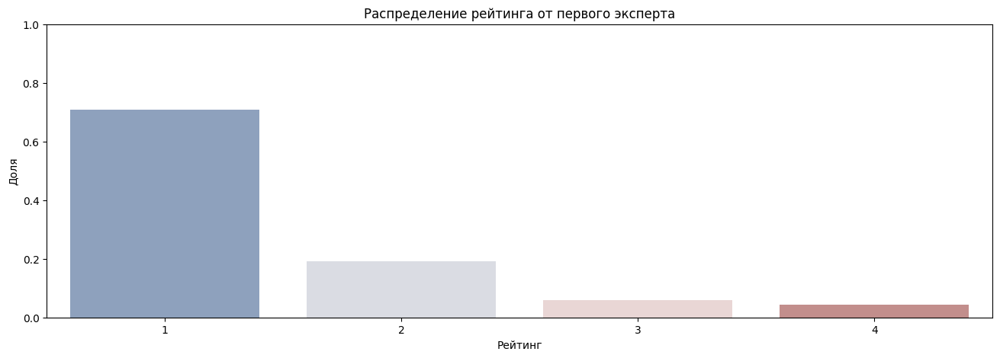

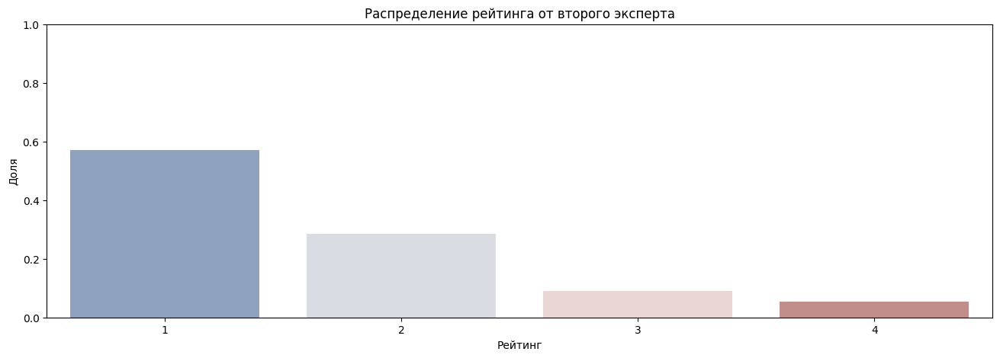

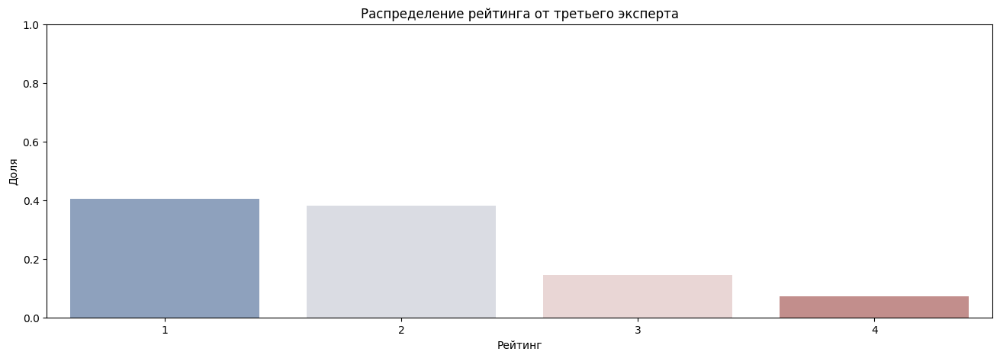

In [13]:
def plot_barplot(data, title):
    plt.figure(figsize=(16, 5))
    sns.barplot(x=np.round(data.value_counts().index, 2), y=data.value_counts(normalize=True),palette="vlag")
    plt.title(title)
    plt.xlabel('Рейтинг')
    plt.ylabel('Доля')
    plt.ylim(0, 1)
    plt.show()

plot_barplot(data_expert['first'], 'Распределение рейтинга от первого эксперта')
plot_barplot(data_expert['second'], 'Распределение рейтинга от второго эксперта')
plot_barplot(data_expert['third'], 'Распределение рейтинга от третьего эксперта')

Посмотрим распределение оценок в цифрах

In [14]:
data_expert.loc[:,'first':].describe().T

,count,mean,std,min,25%,50%,75%,max
first,5822.0,1.436620,0.787084,1.0,1.0,1.0,2.0,4.0
second,5822.0,1.624356,0.856222,1.0,1.0,1.0,2.0,4.0
third,5822.0,1.881999,0.904087,1.0,1.0,2.0,2.0,4.0


Можно заметить, что первый эксперт чаще других утверждал, что изображения и текст не соответствуют друг другу. В целом оценку полного соответствия 4 поставили гораздо меньше раз, чем другие, в основном это 1 и 2.¶

Посмотрим что твориться в оценках краудсорсинга (самые частые)¶

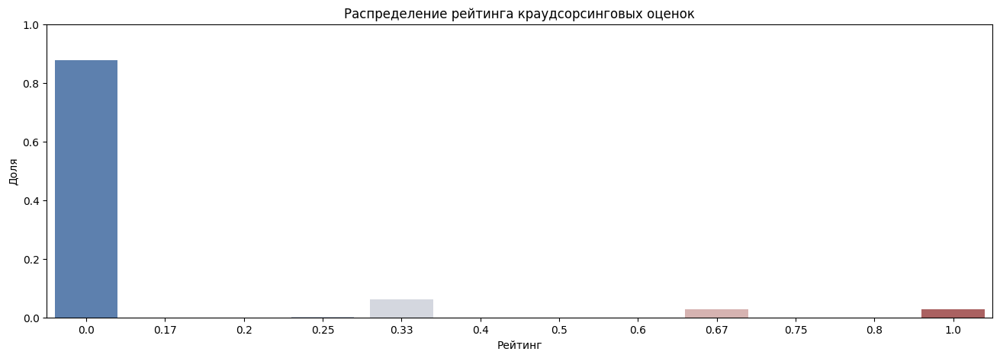

In [15]:
plot_barplot(data_crowd['fraction'], 'Распределение рейтинга краудсорсинговых оценок')

In [16]:
data_crowd.loc[:,'fraction'].describe()

count    47830.000000
mean         0.068786
std          0.207532
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: fraction, dtype: float64

print('Количество уникальных сочетаний фото-текст оцененных экспертами:', ExpertAnnotations.drop_duplicates().shape[0])
print('Количество уникальных сочетаний фото-текст оцененных людьми:', CrowdAnnotations.drop_duplicates().shape[0])

Соответствие изображений и описаний друг другу в обучающем и тестовом наборах¶

In [17]:
test_query[test_query['query_id'].str[:-2] != test_query['image']].shape[0]

0

In [18]:
print('Уникальных текстовых описаний в трейне:', len(set(train_data['query_text'])))
print('Уникальных текстовых описаний в тесте:', len(set(test_query['query_text'])))
print('Уникальных текстовых описаний которые есть в обоих наборах:', len(set(train_data['query_text'])\
                                                                         & set(test_query['query_text'])))

Уникальных текстовых описаний в трейне: 977
Уникальных текстовых описаний в тесте: 500
Уникальных текстовых описаний которые есть в обоих наборах: 0


In [19]:
print('Уникальных картинок в трейне:', len(set(train_data['image'])))
print('Уникальных картинок в тесте:', len(set(test_query['image'])))
print('Уникальных картинок которые есть в обоих наборах:', len(set(train_data['image']) & set(test_query['image'])))

Уникальных картинок в трейне: 1000
Уникальных картинок в тесте: 100
Уникальных картинок которые есть в обоих наборах: 0


### Посмотрим изображения входящие в датасет

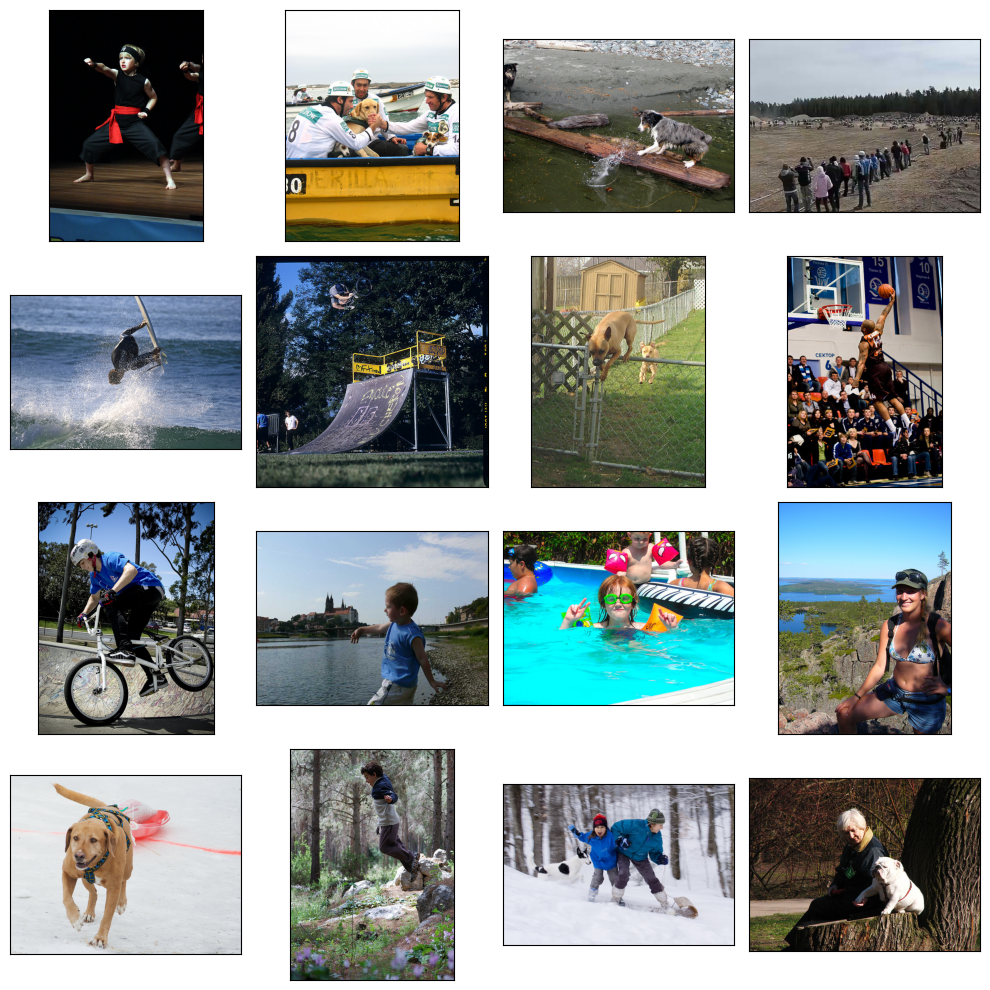

In [20]:
samples_train = list(train_data['image'].sample(8))
samples_test = list(test_query['image'].sample(8))

fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(os.path.join(PATH, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(os.path.join(PATH, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Можно увидеть, что изображения разного формата, изображающие людей и не только, есть изображения с детьми, которые нельзя использовать в обучающей выборке

In [21]:
def transform_range(x):
    return round((x - 1) / 3.0, 2)

def agr_data(row):
    """
    Функция агрегирует оценки экспертов.
    
    Args:
        row (pd.Series): Строка с оценками экспертов.
        
    Returns:
        pd.Series: Строка с агрегированными оценками.
    """
    # В случае, когда нет согласия между экспертными оценками, выполняется усреднение оценок и округление результата вниз
    
    if row['first'] != row['second'] != row['third']:
        row['agr_expert'] = math.floor((row['first'] + row['second'] + row['third']) / 3)
    else:
        row['agr_expert'] = int(np.median(row['first':'third']))
    
    return row

# Применяем функцию к DataFrame
data_expert = data_expert.progress_apply(agr_data, axis=1)

data_expert

100%|██████████| 5822/5822 [00:06<00:00, 868.56it/s] 


,image,query_id,first,second,third,agr_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1
...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,1
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,1
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,1
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,1


In [22]:
# Объединим два DataFrame с оценками экспертов и краудсорсинга
data_merged = pd.merge(data_expert, data_crowd, on=['image', 'query_id'], how='left', suffixes=('_expert', '_crowd'))

data_merged

,image,query_id,first,second,third,agr_expert,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1,0.000000,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1,0.000000,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,1,NaN,NaN,NaN
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,1,0.000000,0.0,3.0
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,1,0.000000,0.0,3.0
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,1,NaN,NaN,NaN


In [23]:
# Посчитаем количество пропущенных значений в столбцах 'agr_expert' и 'fraction' после объединения массивов
missing_agr_expert = data_merged['agr_expert'].isna().sum()
missing_fraction = data_merged['fraction'].isna().sum()

print(f'Количество NaN значений в столбце "agr_expert" после объединения: {missing_agr_expert}')
print(f'Количество NaN значений в столбце "fraction" после объединения: {missing_fraction}')
print()

Количество NaN значений в столбце "agr_expert" после объединения: 0
Количество NaN значений в столбце "fraction" после объединения: 3493



In [24]:

def fill_nan(row):
    
    if np.isnan(row['agr_expert']):
        row['agr_expert'] = row['fraction']
    
    elif np.isnan(row['fraction']):
        
        row['fraction'] = row['agr_expert']

    return row

# Применяем функцию fill_nan к каждой строке в DataFrame data_merged
data_merged = data_merged.progress_apply(fill_nan, axis=1)
data_merged

100%|██████████| 5822/5822 [00:00<00:00, 10930.53it/s]


,image,query_id,first,second,third,agr_expert,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1,0.000000,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1,0.000000,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1,1.000000,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2,2.000000,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1,1.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,1,1.000000,NaN,NaN
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,1,0.000000,0.0,3.0
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,1,0.000000,0.0,3.0
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,1,1.000000,NaN,NaN


In [25]:
data_merged['agr_expert'] = (data_merged['agr_expert'] - 1) / 3.0

data_merged['agr_expert'] = round(data_merged['agr_expert'], 2)

data_merged

,image,query_id,first,second,third,agr_expert,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.00,0.000000,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.00,0.000000,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.00,1.000000,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.33,2.000000,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.00,1.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,0.00,1.000000,NaN,NaN
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,0.00,0.000000,0.0,3.0
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,0.00,0.000000,0.0,3.0
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,0.00,1.000000,NaN,NaN


Удалим пропуски

In [26]:
data_merged.dropna(axis=1, inplace=True)

data_merged

,image,query_id,first,second,third,agr_expert,fraction
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.00,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.00,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.00,1.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.33,2.000000
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.00,1.000000
...,...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,0.00,1.000000
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,0.00,0.000000
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,0.00,0.000000
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,0.00,1.000000


In [27]:
# Производим агрегацию оценок, учитывая как мнение экспертов, так и оценку краудсорсинга.
# Вес мнения экспертов составляет 75%, а вес оценки краудсорсинга - 25%.
def scoring(row):
    row['score'] = row['agr_expert'] * 0.75 + row['fraction'] * 0.25
    return row

# Применяем функцию scoring к каждой строке датасета.
data_merged = data_merged.progress_apply(scoring, axis=1)

display(data_merged)

display(data_merged.describe())

100%|██████████| 5822/5822 [00:04<00:00, 1232.75it/s]


,image,query_id,first,second,third,agr_expert,fraction,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.00,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.00,0.000000,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.00,1.000000,0.250000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.33,2.000000,0.747500
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.00,1.000000,0.250000
...,...,...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,0.00,1.000000,0.250000
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,0.00,0.000000,0.000000
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,0.00,0.000000,0.000000
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,0.00,1.000000,0.250000


,first,second,third,agr_expert,fraction,score
count,5822.000000,5822.000000,5822.000000,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999,0.207461,0.823050,0.361359
std,0.787084,0.856222,0.904087,0.285472,0.664725,0.269930
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,0.000000,0.000000,0.250000
50%,1.000000,1.000000,2.000000,0.000000,1.000000,0.250000
75%,2.000000,2.000000,2.000000,0.330000,1.000000,0.502500
max,4.000000,4.000000,4.000000,1.000000,4.000000,1.750000


In [28]:
# Объединим train_data с получившимся массивом data_merged по столбцам 'image' и 'query_id'
train_data = pd.merge(train_data, data_merged[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [29]:
train_data.head()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2475
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500


In [30]:
train_data.describe()

,score
count,5822.000000
mean,0.361359
std,0.269930
min,0.000000
25%,0.250000
50%,0.250000
75%,0.502500
max,1.750000


In [31]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   score       5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


In [32]:
notna_train = train_data[train_data['query_text'].notna()]

In [33]:
# Заполним все пропущенные значения в столбце 'query_text' на основе 'query_id'
def fillna_train(row):
    
    if pd.isnull(row['query_text']):
        text = notna_train[notna_train['query_id'] == row['query_id']]['query_text']
        if len(text) != 0:
            row['query_text'] = text.iloc[0]
    return row

# Применяем функцию для заполнения пропущенных значений
train_data = train_data.progress_apply(fillna_train, axis=1)

100%|██████████| 5822/5822 [00:00<00:00, 16153.90it/s]


In [34]:
train_data.head()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2475
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500


In [35]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   score       5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


In [36]:
# Удалим строки с NaN значениями, для которых не было найдено соответствующего 'query_id'
train_data.dropna(inplace=True)

display(train_data.head(10))
train_data.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2475
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2475
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2500
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   score       5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


In [37]:
# Выберем строки, где значение 'score' больше 70%
limit = 0.7
limit_data = train_data[train_data['score'] > limit]

display(limit_data)

,image,query_id,query_text,score
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0000
16,2718495608_d8533e3ac5.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1.0000
19,3506560025_8d0f4f9ac4.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.7475
23,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.7475
25,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.7475
...,...,...,...,...
5780,3602838407_bf13e49243.jpg,3452127051_fa54a902b3.jpg#2,A dark dog is competing in a dog show competit...,0.7475
5781,493621130_152bdd4e91.jpg,3452127051_fa54a902b3.jpg#2,A dark dog is competing in a dog show competit...,0.7475
5793,3741462565_cc35966b7a.jpg,2089426086_7acc98a3a8.jpg#2,A girl in a winter coat with a birthday cake .,0.7475
5807,497791037_93499238d8.jpg,3568197730_a071d7595b.jpg#2,An actor dressed as a pirate performs in an ou...,0.7475


## 2. Проверка данных


In [38]:
BLOCK_WORDS = ['child', 'boy', 'girl', 'baby', 'teen', 'teenager', 'kid', \
               'infant', 'youngster', 'kids', 'children', 'boys', 'girls', \
               'babies', 'teens', 'teenagers', 'youth', 'toddler', 'adolescent',\
               'juvenile', 'offspring', 'minors', 'junior', 'tots', 'youthful', \
               'newborn', 'offspring', 'little one', 'munchkin', 'toddlers']

In [39]:
print(nltk.data.path)

['/root/nltk_data', '/usr/share/nltk_data', '/usr/local/share/nltk_data', '/usr/lib/nltk_data', '/usr/local/lib/nltk_data']


In [40]:
# Загрузка необходимых ресурсов для NLTK

nltk.download('punkt')
nltk.download('omw-1.4')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [41]:
nlp = spacy.load("en_core_web_sm")

In [42]:
def lemmatize_text(phrase):
    # Приведение текста к нижнему регистру и удаление символов, кроме букв
    phrase = re.sub('[^a-zA-Z]', ' ', phrase).lower()
    # Лемматизация текста с использованием spaCy
    doc = nlp(phrase)
    lemmatized_text = ' '.join([token.lemma_ for token in doc])  
    return lemmatized_text

In [43]:
# Функция для блокировки текстов с определенными словами
def blocking(row):
    if isinstance(row['query_text'], str):  # Проверяем, является ли 'query_text' строкой
        # Лемматизация текста с использованием spaCy
        lemmatized_text = lemmatize_text(row['query_text'])
        # Поиск слов из списка BLOCK_WORDS в лемматизированном тексте
        block_words_found = any(word in lemmatized_text for word in BLOCK_WORDS)
        # Возвращаем 1, если есть блокирующие слова, и 0 в противном случае
        return 1 if block_words_found else 0
    else:
        return 0  # Если 'query_text' не является строкой, возвращаем 0

In [44]:
# Применение функции блокировки к датафрейму
train_data['block_words'] = train_data.apply(blocking, axis=1)

In [45]:
train_data

,image,query_id,query_text,score,block_words
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.250000,1
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.247500,1
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000,1
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.250000,1
...,...,...,...,...,...
5817,757046028_ff5999f91b.jpg,2061144717_5b3a1864f0.jpg#2,A man in an ampitheater talking to a boy .,0.330833,1
5818,799486353_f665d7b0f0.jpg,2196107384_361d73a170.jpg#2,a old man walks down the uncrowded road .,0.250000,0
5819,909808296_23c427022d.jpg,2112921744_92bf706805.jpg#2,A dog stands on the side of a grassy cliff .,0.747500,0
5820,929679367_ff8c7df2ee.jpg,3651971126_309e6a5e22.jpg#2,A blurry photo of two dogs .,0.502500,0


In [46]:
# Выборем несколько случайных заблокированных изображений для отображения
samples_block = list(train_data[train_data['block_words'] == 1]['query_id'].sample(16))

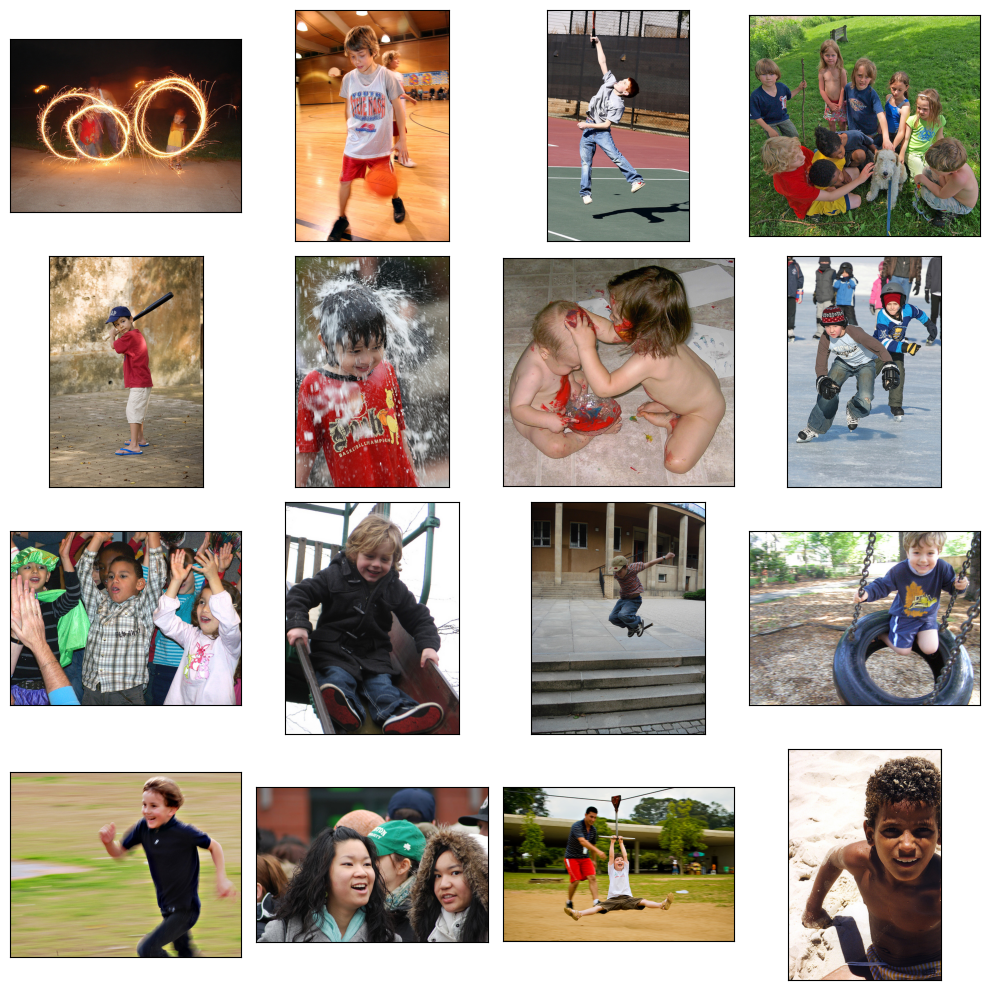

In [47]:
fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(os.path.join(PATH, 'train_images'), samples_block[i][:-2]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

# Отображение выбранных изображений
plt.show()



In [48]:
# Удаление строк с блокированными изображениями и столбца 'block_words'
train_data = train_data.loc[train_data['block_words'] == 0]
train_data.drop(columns=['block_words'], inplace=True)

train_data.head()

/tmp/ipykernel_19/675831930.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data.drop(columns=['block_words'], inplace=True)


,image,query_id,query_text,score
22,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.2500
23,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.7475
24,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.2475
25,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.7475
26,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.2500


In [49]:
bad_images = set(train_data.query_id[train_data.query_text.str.contains('|'.join(BLOCK_WORDS), case=False)].str[:-2])
bad_images = list(bad_images)

In [50]:
train_data = train_data[~train_data.query_id.str[:-2].isin(bad_images)]

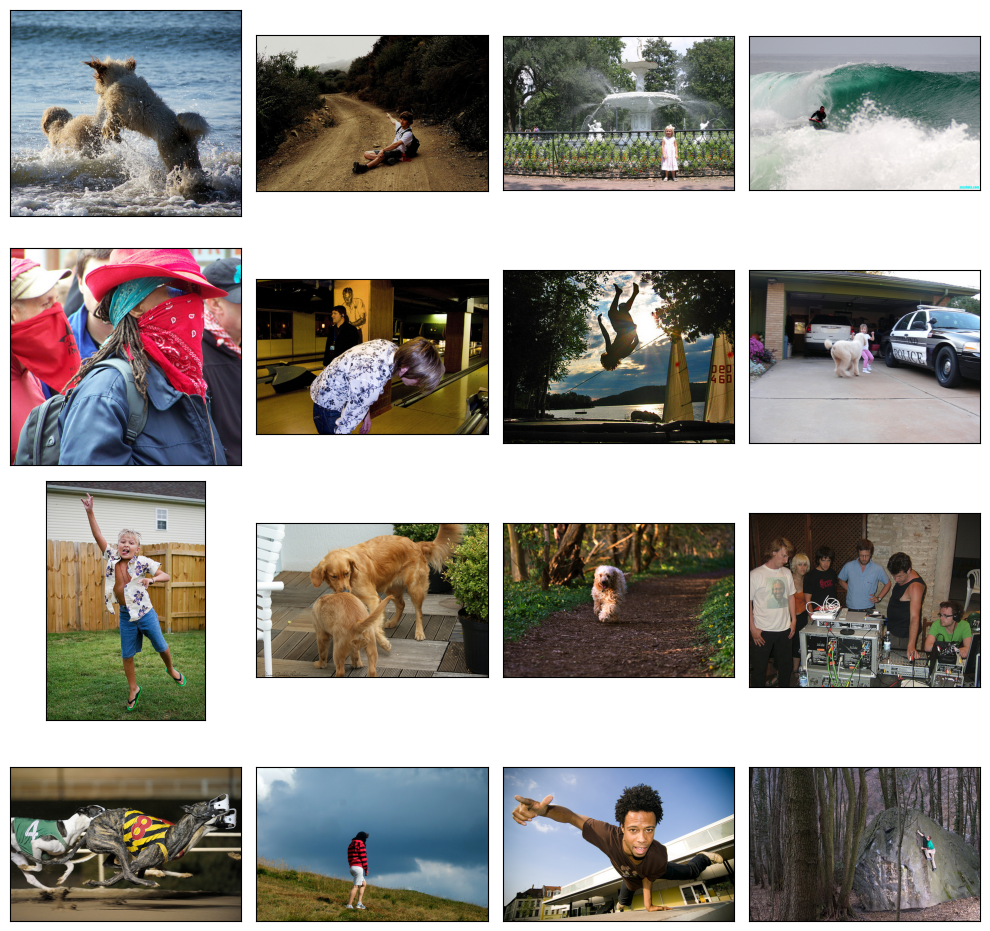

In [51]:
samples_train = list(train_data['image'].sample(16))

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(os.path.join(PATH, 'train_images'), samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [52]:
train_data.head()

,image,query_id,query_text,score
22,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.2500
23,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.7475
24,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.2475
25,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.7475
26,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.2500


In [53]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4230 entries, 22 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4230 non-null   object 
 1   query_id    4230 non-null   object 
 2   query_text  4230 non-null   object 
 3   score       4230 non-null   float64
dtypes: float64(1), object(3)
memory usage: 165.2+ KB


## 3. Векторизация изображений



Возьмем архитектуру resnet50 со стандартрными весами (как раз полученными на датасете resnet50 ImageNet). Уберем последние два слоя, чтобы получить на выходе вектор. На примере одного из изображений посмотрим, какой вектор получается.

In [54]:
# Создаем генератор данных для обучения модели
train_datagen = ImageDataGenerator(rescale=1./255)

train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_data,
        directory=Path(os.path.join(PATH, 'train_images')),
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=12345)

# Генерируем и отображаем изображения и их оценки
features, target = train_gen_flow.next()

Found 4230 validated image filenames.


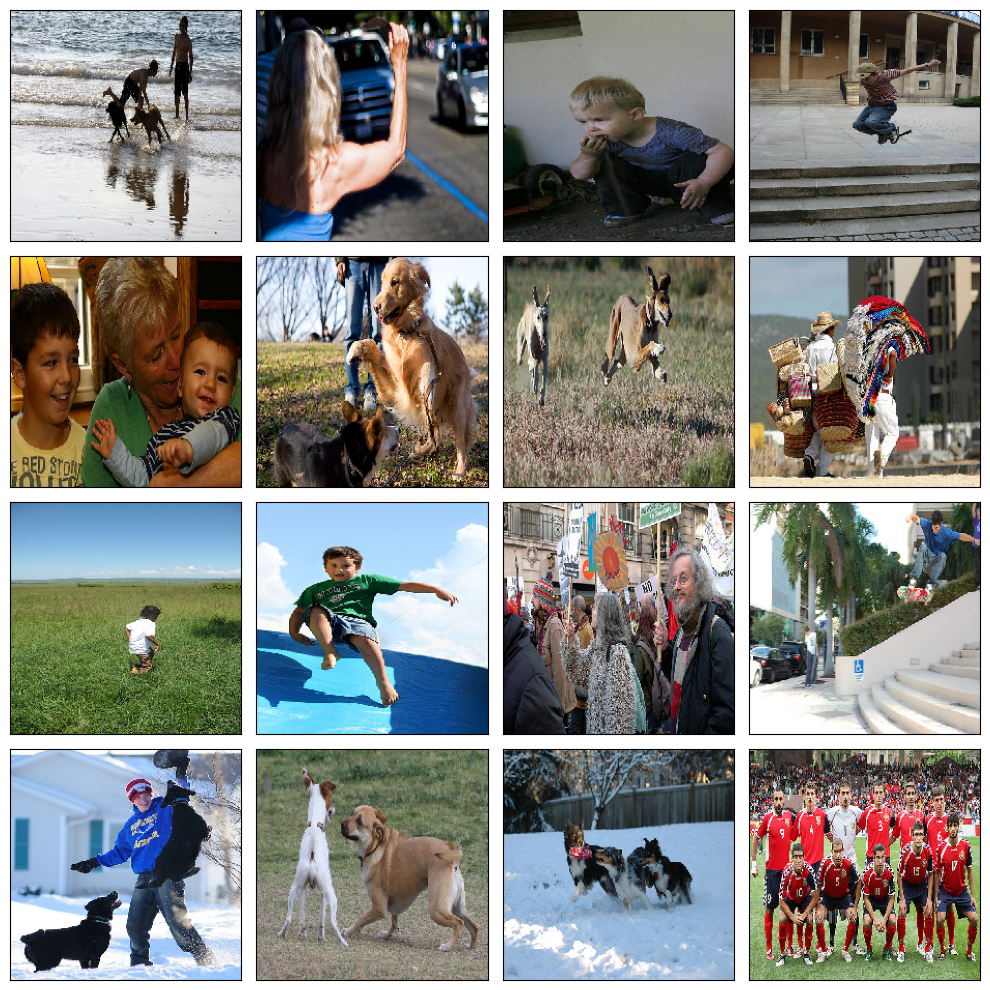

In [55]:
fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [56]:
# Создадим свёрточную нейросеть, она позволит извлечь главные компоненты изображений

def create_model():
    # Загружаем предварительно обученную модель ResNet50 без верхних слоев и весов ImageNet
    backbone = ResNet50(input_shape=(224, 224, 3),
                        include_top=False,
                        weights='imagenet')

    model = Sequential()
    # Добавляем загруженную модель как основу
    model.add(backbone)
    # Добавляем слой GlobalAveragePooling2D для усреднения признаков по пространству
    model.add(GlobalAveragePooling2D())
    # Компилируем модель, используя среднеквадратичную ошибку как функцию потерь и оптимизатор Adam с низкой скоростью обучения
    model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.0001), metrics=['mae'])

    return model

In [57]:
def image_vectorization(model, train_data):
    """
    Выполняет векторизацию изображений с использованием заданной модели.

    Args:
        model (tf.keras.models.Model): Модель для векторизации изображений.
        train_data (tf.keras.utils.data.DataGenerator): Генератор данных с изображениями.

    Returns:
        np.ndarray: Векторизованные представления изображений.
    """
    predictions = model.predict(train_data)
    return predictions

In [58]:
# Создадим модель для векторизации изображений
image_model = create_model()

# Выполним векторизацию изображений с использованием созданной модели и генератора данных
image_embeddings = image_vectorization(image_model, train_gen_flow)

# Выведем размерность полученных векторизованных представлений
image_embeddings.shape

265/265 [==============================] - 419s 2s/step


(4230, 2048)

## 4. Векторизация текстов




Будем использовать BERT

In [59]:
# Загрузим предобученную модель BERT и предпроцессор для нее
bert_backbone = keras_nlp.models.BertBackbone.from_preset('bert_base_en')
bert_preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

213450/213450 [==============================] - 0s 0us/step


In [60]:
# Создадим пустой список для хранения векторных представлений текстов и получим тексты из train_data
embeddings = []
text = list(train_data['query_text'])
tokenized = bert_preprocessor(text)
batch_size = 32

# Итерируемся по батчам текстов и вычисляем их векторные представления
for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
    tokens = tokenized['token_ids'][batch_size * i:batch_size * (i + 1)]
    token_types = tokenized['segment_ids'][batch_size * i:batch_size * (i + 1)]
    mask = tokenized['padding_mask'][batch_size * i:batch_size * (i + 1)]

    batch = {'token_ids': tokens, 'segment_ids': token_types, 'padding_mask': mask}

    batch_embeddings = bert_backbone.predict(batch, verbose=0)

    embeddings.append(batch_embeddings['pooled_output'])

# Объединим полученные векторные представления
embeddings = np.concatenate(embeddings)

  0%|          | 0/133 [00:00<?, ?it/s]

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [61]:
# Объединим векторные представления изображений и текста в один признаковый массив
features = np.concatenate((image_embeddings, embeddings), axis=1)

# Получим целевую переменную
target = np.array(train_data['score'])

# Выведем размерности полученных массивов
print("Размерность массива признаков:", features.shape)
print("Размерность целевой переменной:", target.shape)

Размерность массива признаков: (4230, 2816)
Размерность целевой переменной: (4230,)


ВЫВОД: После векторизации текста и изображений и обьединения в единый датафрейм мы получили размерность массива признаков  и размерность целевой переменной указанных выше.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

В качестве метрики возьмем RMSE и будем оптимизировать ее, так как нам важно наиболее точное численное предсказание модели.

In [62]:
# Разделим данные на обучающую и тестовую выборки, учитывая группы изображений
groups = train_data['image']

# Используем GroupShuffleSplit для разделения данных, сохраняя группы изображений вместе
gss = GroupShuffleSplit(n_splits=1, train_size=.6, random_state=12345)
train_indices, test_indices = next(gss.split(X=features, y=target, groups=groups))

# Разделим признаки и целевую переменную на обучающую и тестовую выборки
features_train, features_test = features[train_indices], features[test_indices]
target_train, target_test = target[train_indices], target[test_indices]

# Выведем размерности обучающей и тестовой выборок
print("Размерности обучающей выборки (признаки, целевая переменная):", features_train.shape, target_train.shape)
print("Размерности тестовой выборки (признаки, целевая переменная):", features_test.shape, target_test.shape)

Размерности обучающей выборки (признаки, целевая переменная): (2526, 2816) (2526,)
Размерности тестовой выборки (признаки, целевая переменная): (1704, 2816) (1704,)


In [63]:
# Выведем статистику по признакам в обучающей и тестовой выборках
print('Статистика по обучающей выборке:')
print('Максимальное значение в features_train:', features_train.max())
print('Минимальное значение в features_train:', features_train.min())
print('Среднее значение в features_train:', features_train.mean())
print('Стандартное отклонение в features_train:', features_train.std())

print('\nСтатистика по тестовой выборке:')
print('Максимальное значение в features_test:', features_test.max())
print('Минимальное значение в features_test:', features_test.min())
print('Среднее значение в features_test:', features_test.mean())
print('Стандартное отклонение в features_test:', features_test.std())

Статистика по обучающей выборке:
Максимальное значение в features_train: 15.303109
Минимальное значение в features_train: -1.0
Среднее значение в features_train: 0.079963
Стандартное отклонение в features_train: 0.68999857

Статистика по тестовой выборке:
Максимальное значение в features_test: 15.303109
Минимальное значение в features_test: -0.9999984
Среднее значение в features_test: 0.07986694
Стандартное отклонение в features_test: 0.6900238


In [64]:
# Инициализируем и обучаем StandardScaler на обучающих данных
scaler = StandardScaler()
scaler.fit(features_train)

# Преобразуем обучающие и тестовые данные с помощью StandardScaler
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

Прекрасно, отправная точка присутствует. Теперь создадим полносвязную нейронную сеть.

In [65]:
# Обучим модель линейной регрессии
model_lr = LinearRegression().fit(features_train, target_train)

# Получим прогнозы
predictions = model_lr.predict(features_test)

# Вычислим и выведем RMSE (Корень из среднеквадратичной ошибки)
rmse_lr = np.sqrt(mean_squared_error(target_test, predictions))
print(f'RMSE для модели линейной регрессии: {rmse_lr:.4f}')

RMSE для модели линейной регрессии: 7.3821


In [66]:
# Обучим модель Ridge регрессии (с регуляризацией L2)
model_ridge = Ridge().fit(features_train, target_train)

# Получим прогнозы
predictions_ridge = model_ridge.predict(features_test)

# Вычислим и выведем RMSE (Корень из среднеквадратичной ошибки)
rmse_ridge = np.sqrt(mean_squared_error(target_test, predictions_ridge))
print(f'RMSE для модели Ridge регрессии: {rmse_ridge:.4f}')

RMSE для модели Ridge регрессии: 0.5602


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:253: LinAlgWarning: Ill-conditioned matrix (rcond=3.77568e-08): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


In [67]:
model_nn = Sequential()

model_nn.add(Dense(1024, activation='relu', input_shape=(2816,)))
model_nn.add(BatchNormalization())
model_nn.add(Dense(512, activation='tanh'))
model_nn.add(Dropout(0.2))
model_nn.add(Dense(256, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(128, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(64, activation='relu'))
model_nn.add(Dense(1, activation='linear'))  # убрала Flatten

model_nn.compile(loss='mean_squared_error',
                optimizer=Adam(lr=0.0001),
                metrics=[RootMeanSquaredError()])

In [68]:
# Обучим нейросеть
model_nn.fit(
    features_train,  
    target_train,    
    epochs=24,      # добавила эпохи с 8 до 16  вообще несущественно (RMSE train min = 0.2244 val min = 0.2712), до 24 
    batch_size=32,   
    validation_data=(features_test, target_test),  
    validation_steps=math.ceil(features_train.shape[1] / 32), 
    verbose=2        
)
loss = nn.MSELoss()

Epoch 1/24
79/79 - 7s - loss: 0.3624 - root_mean_squared_error: 0.6020 - val_loss: 0.3126 - val_root_mean_squared_error: 0.5591 - 7s/epoch - 92ms/step
Epoch 2/24
79/79 - 3s - loss: 0.1178 - root_mean_squared_error: 0.3433 - 3s/epoch - 34ms/step
Epoch 3/24
79/79 - 3s - loss: 0.0993 - root_mean_squared_error: 0.3152 - 3s/epoch - 33ms/step
Epoch 4/24
79/79 - 3s - loss: 0.0942 - root_mean_squared_error: 0.3070 - 3s/epoch - 33ms/step
Epoch 5/24
79/79 - 3s - loss: 0.0862 - root_mean_squared_error: 0.2936 - 3s/epoch - 34ms/step
Epoch 6/24
79/79 - 3s - loss: 0.0791 - root_mean_squared_error: 0.2813 - 3s/epoch - 34ms/step
Epoch 7/24
79/79 - 3s - loss: 0.0785 - root_mean_squared_error: 0.2802 - 3s/epoch - 37ms/step
Epoch 8/24
79/79 - 3s - loss: 0.0743 - root_mean_squared_error: 0.2725 - 3s/epoch - 34ms/step
Epoch 9/24
79/79 - 3s - loss: 0.0725 - root_mean_squared_error: 0.2693 - 3s/epoch - 34ms/step
Epoch 10/24
79/79 - 3s - loss: 0.0685 - root_mean_squared_error: 0.2618 - 3s/epoch - 34ms/step
Ep

Вывод:
Мы разделили данные для обучения модели  на обучающую и тестовую выборки


Необходимо было учитывать связанные между собой группы изображений, которые могли создать зависимость между данными.

Поэтому мы применили GroupShuffleSplit, который позволил исключить попадание одного изображения в обучающий и валидационный наборы. 

Обучающая выборка составила 60% от общего количества данных

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [69]:
test_images_path = os.path.join(PATH, 'test_images')
image_filenames = [filename for filename in os.listdir(test_images_path) if filename.endswith('.jpg')]
test_image = pd.DataFrame(image_filenames, columns=['image'])
test_image.name = 'test_image'

In [70]:
# Создадим генератор для тестовых данных
test_datagen = ImageDataGenerator(rescale=1./255) 
test_gen_flow = train_datagen.flow_from_dataframe(
    dataframe=test_image,     
    directory=Path(test_images_path),  
    x_col='image',   
    y_col='score',   
    target_size=(224, 224),  
    batch_size=16,   
    class_mode='input',  
    seed=12345  
)

Found 100 validated image filenames.


In [71]:
# Получим векторные представления изображений для тестовых данных
image_embedings = image_vectorization(create_model(), test_gen_flow)
# Определим размерность полученных векторов
image_embedings.shape

7/7 [==============================] - 11s 1s/step


(100, 2048)

In [72]:
def txt_vec(text):
    # Создаем список для хранения векторных представлений текстовых данных
    test_embeddings = []
    # Токенизируем и предобрабатываем текст
    tokenized = bert_preprocessor(text)
    batch_size = 4

    # Итерируемся по батчам текстовых данных
    for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
        tokens = tokenized['token_ids'][batch_size * i:batch_size * (i + 1)]
        token_types = tokenized['segment_ids'][batch_size * i:batch_size * (i + 1)]
        mask = tokenized['padding_mask'][batch_size * i:batch_size * (i + 1)]
        batch = {'token_ids': tokens,
                 'segment_ids': token_types,
                 'padding_mask': mask}
        # Извлекаем векторные представления с помощью модели BERT
        batch_embeddings = bert_backbone.predict(batch, verbose=0)
        test_embeddings.append(batch_embeddings['pooled_output'])

    # Объединяем векторные представления в один массив
    text_embeddings_test = np.concatenate(test_embeddings)
    return text_embeddings_test

In [73]:
def inference(text):
    # Проверяем оригинальный текст на наличие запрещенных слов
    bin_array = [word for word in text.split() if word in BLOCK_WORDS] # ИСПРАВЛЕНО вместо лемматизации используем split 
    if bin_array:
        # Если найдены запрещенные слова, выводим сообщение о недоступности изображения
        print('-' * 100)
        print()
        print(text)
        print()
        print('#' * 77)
        s = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## {s} ##')
        print('#' * 77)
        print()
    else:
        # Если запрещенных слов нет, выполняем инференс
        text_embed = txt_vec(text=[text])
        feature = np.concatenate((image_embedings, np.resize(text_embed, (image_embedings.shape[0], 768))), axis=1)
        feature = scaler.transform(feature)
        predictions = model_nn.predict(feature)

        data = pd.concat((test_image, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='predictions')), axis=1)
        top = list(data.sort_values(by='predictions', ascending=False)['image'].head(5))
        top_score = list(data.sort_values(by='predictions', ascending=False)['predictions'].head(5))

        print()
        print(text)
        print()

        # Отображаем топ-5 изображений с наивысшими предсказанными оценками
        fig = plt.figure(figsize=(15, 6))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i + 1, title=round(top_score[i], 2))
            image = Image.open(Path(test_images_path, top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        # Если текст запроса совпадает с текстом в тестовой выборке, выделяем изображение зеленым цветом
        if text in list(test_query['query_text']):
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(test_images_path, test_query.iloc[test_query[test_query['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            print()

        plt.show()

        print('-' * 100)
    return None

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step

A white dog with a branch in his mouth and a black dog .




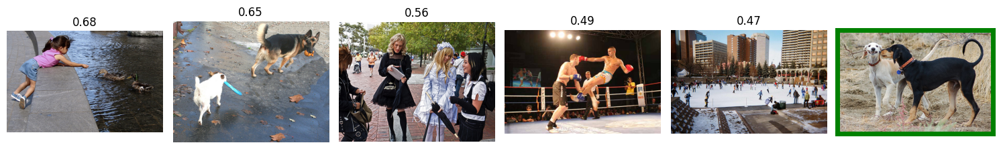

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

a guy and a girl jumping up in the air

#############################################################################
## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##
#############################################################################



  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step

the man is wearing a backpack and sunglasses while walking through an outdoor market .




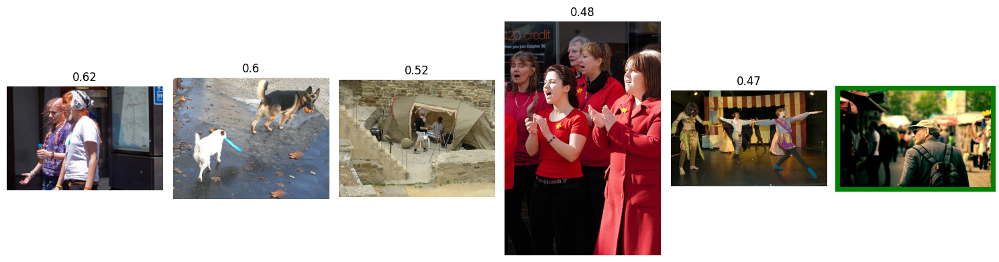

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step

a man leans against a large robot .




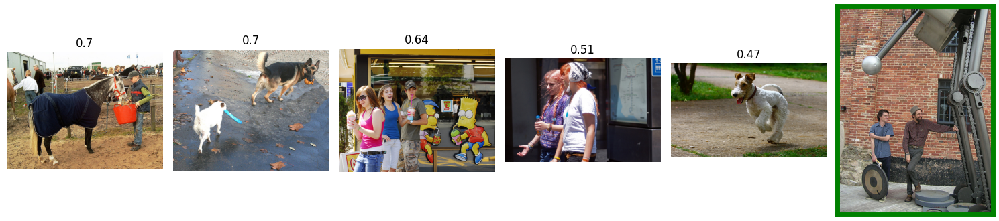

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 10ms/step

A man sits on the gravel by an ocean .




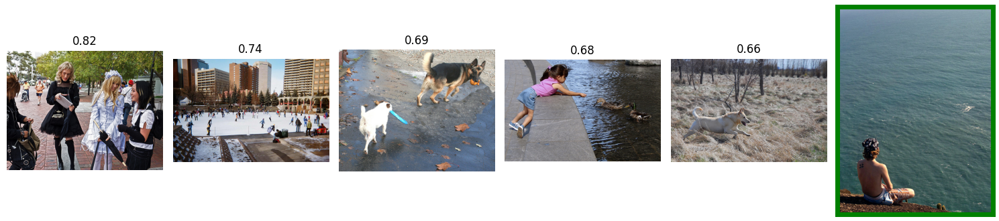

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step

A white dog with beige spots is running through a field .




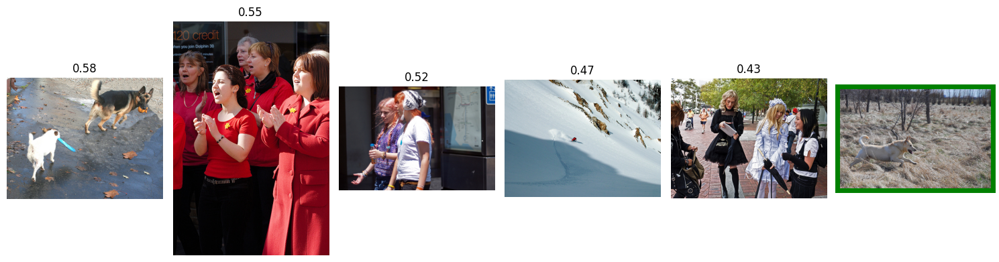

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step

A brown dog is sitting in some long grass .




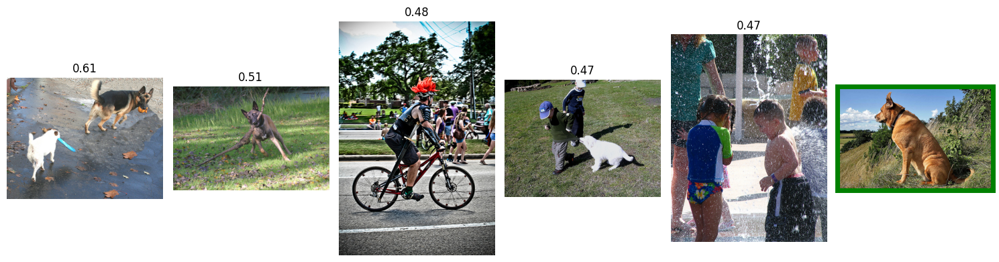

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step

A salt-and-pepper-haired man with beard and glasses wearing black sits on the grass .




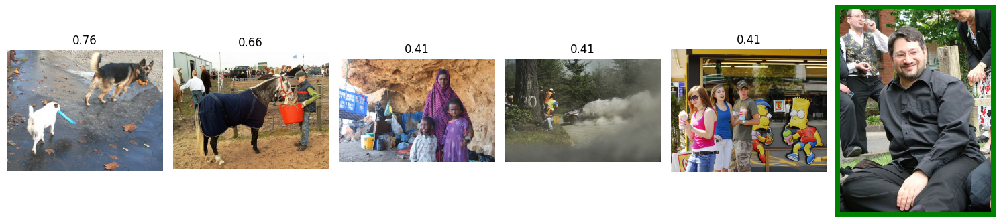

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step

A blue bird flying over water .




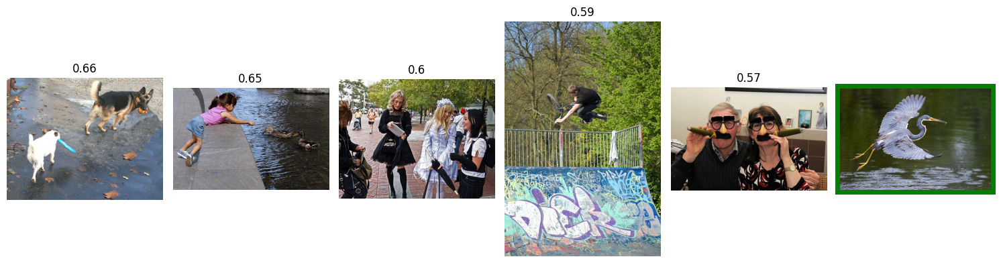

----------------------------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step

Girls with orange hair standing on the street with some kind of bottle in their hand .




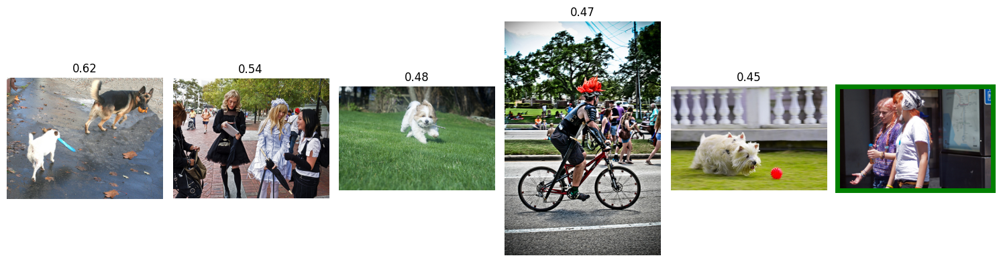

----------------------------------------------------------------------------------------------------


In [74]:
# Выбираем 10 случайных фраз из тестовой выборки и выполняем инференс для каждой из них
test_phrases = list(test_query['query_text'].sample(10))
for phrase in test_phrases:
    inference(phrase)


Разработан функционал для определения изображений по текстовому представлению.

Он включает:

Генератор данных для тестовых изображений, который позволил подавать изображения на вход модели для получения их векторных представлений

Векторизация изображений для тестовых данных при помощи модели ResNet50. Эти векторы будут использоваться в дальнейшем для сравнения с векторами текстовых запросов

Функция txt_vec, которая выполняет векторизацию текстовых запросов с использованием модели BERT. Эта функция принимает текстовый запрос, токенизирует его и получает векторное представление с помощью модели BERT. 

Функция inference для вывода результатов, способная:

- Получать текст
- Возвращать картинку и метрику близости.
- Выдавать дисклеймер если запрос некорректный

Функция применена к 10 раз к 10 случайным запросам.


Общий вывод заключается в том, что данные были успешно подготовлены и векторизованы для обучения модели, а также проведена проверка на юридическое соответствие. Модель машинного обучения и нейронная сеть были обучены для предсказания соответствия между изображениями и текстовыми запросами. Теперь система готова к использованию для сортировки изображений на основе текстовых запросов